In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import db
import pam
import utils as ut
import features as ft
import dtw
import clustering_evaluation as ce
import seq2seq as s2s

import time

from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from sklearn.metrics import pairwise_distances,homogeneity_completeness_v_measure,silhouette_score,calinski_harabaz_score
import matplotlib.cm as cm
from sklearn.decomposition import PCA

# Get the data

In [2]:
DATA_PATH = "data/grl/"
DATA_BASE = DATA_PATH + "grl.sqlite"
SAVE_PATH = DATA_PATH + "generated_data/"
FRAME_PATH = DATA_PATH + "grl.png"
VIDEO_PATH = DATA_PATH + "grl.MOV"
HOMOGRAPHY = DATA_PATH + "homography.txt"
DISTANCES = SAVE_PATH + "distances/cityblock_50.txt"

### Load trajectories from path

In [3]:
# get every trajectories in the database
#trajectories_u = db.get_trajectories(DATA_BASE)
#trajectories ordered by object, database trajectory ids ordered by objects
trajectories_po,ids_po,nb_objects = db.get_trajectories_by_object(DATA_BASE)

### Unsupervised data

In [4]:
nb_trajectories_per_object_unsup = 1
trajectories_po_unsup,ids_po_unsup = db.filter_trajectories(nb_trajectories_per_object_unsup, trajectories_po, ids_po)

#total number of selected trajectories
nb_trajectories_unsup = nb_trajectories_per_object_unsup * nb_objects

# list of every selected trajectory, 
trajectories_unsup = [t for o in trajectories_po_unsup for t in o]
# ids of every selected trajectory
ids_unsup = [i for o in ids_po_unsup for i in o]
# trajectories in pixel space, for displaying purposes only
pixel_trajectories_unsup = [ut.to_pixel(t,HOMOGRAPHY) for t in trajectories_unsup]

In [5]:
nb_trajectories_unsup

2376

### Supervised data

In [6]:
nb_trajectories_per_object_sup = 5
trajectories_po_sup,ids_po_sup = db.filter_trajectories(nb_trajectories_per_object_sup, trajectories_po, ids_po)

#select subset of objects randomly
selected_objects = np.array(trajectories_po_sup)
selected_objects_ids = np.array(ids_po_sup)

nb_selected_objects = 20
np.random.seed(0)
ids_s = np.random.choice(np.arange(nb_objects),nb_selected_objects,replace = False)

selected_objects = selected_objects[ids_s]
selected_objects_ids = selected_objects_ids[ids_s]
#total number of selected trajectories
nb_trajectories_sup = nb_trajectories_per_object_sup * nb_selected_objects

pixel_trajectories_po_sup = [[ut.to_pixel(t,HOMOGRAPHY) for t in trajectories] for trajectories in selected_objects]


# list of every selected trajectory, 
trajectories_sup = [t for o in selected_objects for t in o]
# ids of every selected trajectory
ids_sup = [i for o in selected_objects_ids for i in o]
# trajectories in pixel space, for displaying purposes only
pixel_trajectories_sup = [ut.to_pixel(t,HOMOGRAPHY) for t in trajectories_sup]

In [7]:
nb_trajectories_sup

100

### Visualize selected trajectories in pixel space (subset of objects)

The red dots are the beginnings of the trajectories, while the green ones are their ends

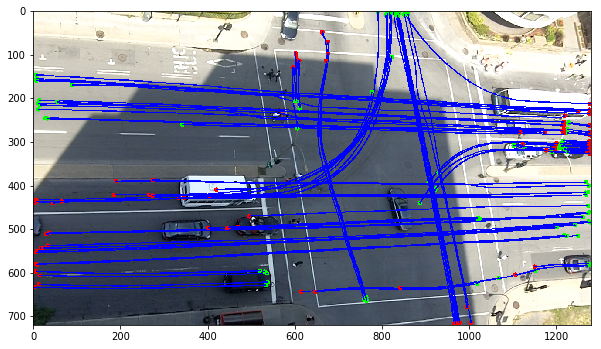

In [31]:
ut.plot_trajectories(FRAME_PATH,pixel_trajectories_sup)

# Supervised

### Trajectory discretization

In [8]:
square_size = 0.142
discretized_trajectories_sup = [dtw.discretize(trajectory,square_size) for trajectory in trajectories_sup]

On the following plots we can see the trajectory number of points distribution before and after the discretization

In [ ]:
plt.hist([len(t) for t in trajectories_sup])

In [ ]:
plt.hist([len(t) for t in discretized_trajectories_sup])

### Effect of discretization on clustering quality

In [9]:
#get the ground truth
labels_true = ce.get_ground_truth(ids_sup,selected_objects_ids)  
square_sizes = np.linspace(0.0, 1.0, num=8)
nb_clusters = nb_selected_objects
values = []
for square_size in square_sizes:
    discretized_trajectories = [dtw.discretize(trajectory,square_size) for trajectory in trajectories_sup]
    discretized_features = [ft.compute_features(trajectory) for trajectory in discretized_trajectories]
    discretized_features,_ = ft.standardize_features(discretized_features)
    discretized_features = pd.DataFrame(discretized_features)
    pca = PCA(n_components=0.99)
    features_pca = pca.fit_transform(discretized_features)
    clusters = KMeans(n_clusters = nb_clusters).fit_predict(features_pca)
    _,_,v = homogeneity_completeness_v_measure(labels_true, clusters)
    values.append(v)

In [10]:
square_sizes[np.argmax(values)],np.max(values)

(0.14285714285714285, 0.8864446274573798)

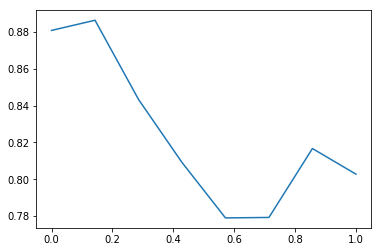

In [11]:
plt.plot(square_sizes,values)

### Compute features

#### Normal trajectories

In [53]:
start = time.time()
features_sup = [ft.compute_features(trajectory) for trajectory in trajectories_sup]
features_sup,_ = ft.standardize_features(features_sup)
features_sup = pd.DataFrame(features_sup)
print("execution duration: " + str(time.time()-start))

execution duration: 3.21614003181


#### Discretized trajectories

In [12]:
start = time.time()
discretized_features_sup = [ft.compute_features(trajectory) for trajectory in discretized_trajectories_sup]
discretized_features_sup,_ = ft.standardize_features(discretized_features_sup)
discretized_features_sup = pd.DataFrame(discretized_features_sup)
print("execution duration: " + str(time.time()-start))

execution duration: 3.21976089478


#### PCA

In [13]:
import matplotlib.cm as cm
from sklearn.decomposition import PCA

pca = PCA(n_components=0.99)
features_pca_sup = pca.fit_transform(discretized_features_sup)
pca.n_components_

17

We will use PCA because it allows to keep 99% of the the data variance while reducing the number of features from 50 to 17

### Clustering evaluation

COnsidering the fact that, the trajectories are initially grouped by object, we can evaluate the quality of the clustering, using these groups as ground truth. And setting the number of clusters required to the number of objects in the database

In [14]:
#get the ground truth
labels_true = ce.get_ground_truth(ids_sup,selected_objects_ids)  

In [15]:
nb_clusters = nb_selected_objects

#### KMEANS

For k-means, take the mean/best performance over a certain number of iterations due to the randomness of initialization.
We use v-measure for evaluation

In [16]:
best_random_state = ce.best_model_rand_init(100,features_pca_sup,labels_true,nb_clusters)

clusters = KMeans(n_clusters=nb_clusters, random_state = best_random_state).fit_predict(features_pca_sup)

(0.9028310388491985, 0.9195276115197243, 0.9111028376228923)


#### Hierarchical

In [17]:
clusters = AgglomerativeClustering(n_clusters = nb_clusters).fit_predict(features_pca_sup)
homogeneity_completeness_v_measure(labels_true, clusters)

(0.8887172791193093, 0.9183539682994616, 0.9032925969480401)

#### K-MEDOIDS

In [19]:
start = time.time()

distance_matrix = pairwise_distances(features_pca_sup,metric="manhattan")
medoids_idx, clusters =pam.pam(distance_matrix, nb_clusters)

print(time.time() - start)
homogeneity_completeness_v_measure(labels_true, clusters)

3.17460393906


(0.896172342787175, 0.9179104769375451, 0.906911165953096)

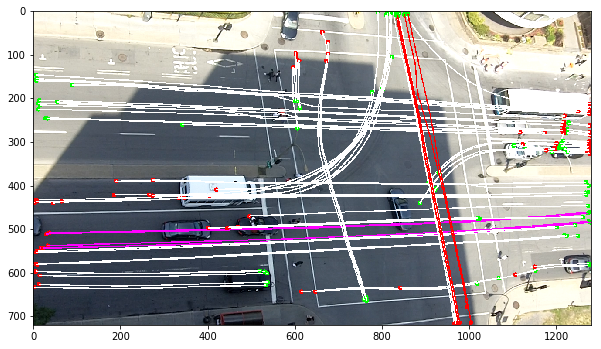

In [64]:
ut.plot_trajectories_by_groups(FRAME_PATH,pixel_trajectories_po_sup)

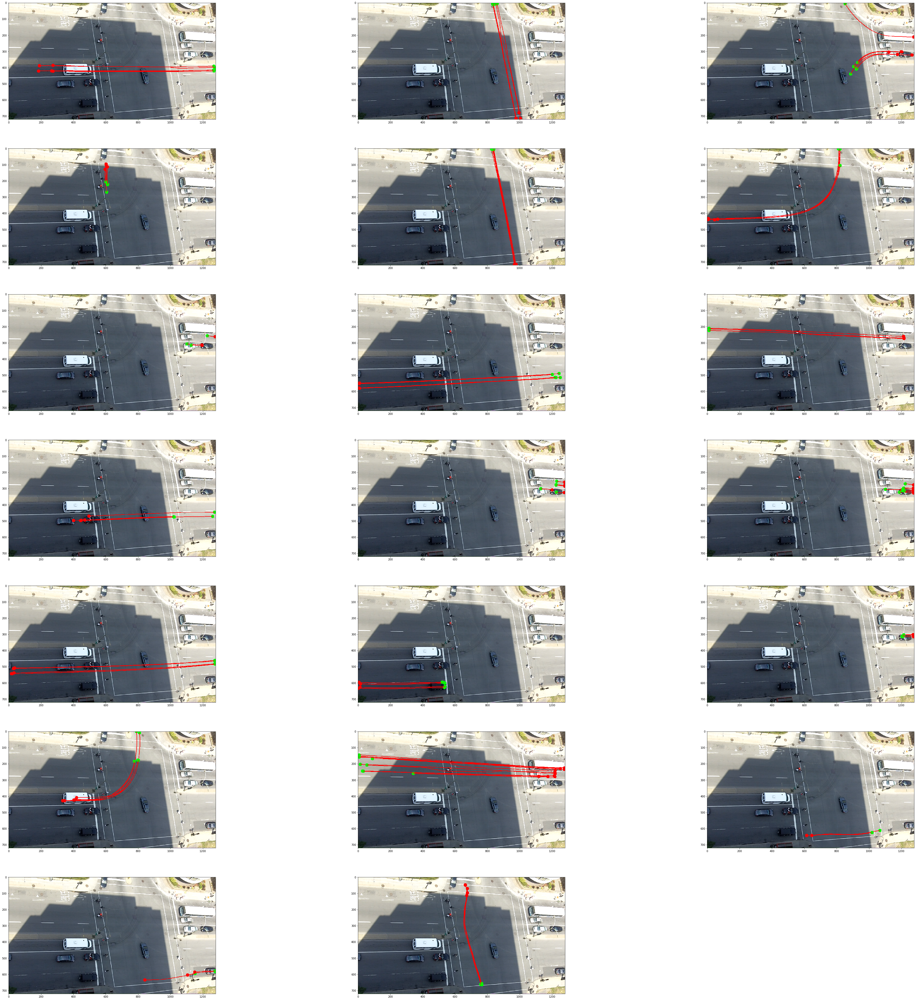

In [65]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories_sup)

## Observations

With a number of trajectories per object greater than 5, pam algorithm without discretiztion gets the the ground truth as clustering result.

# Unsupervised

### Trajectory discretization

In [20]:
square_size = 0.142
discretized_trajectories_unsup = [dtw.discretize(trajectory,square_size) for trajectory in trajectories_unsup]

### Compute features

#### Normal trajectories

In [ ]:
start = time.time()
features_unsup = [ft.compute_features(trajectory) for trajectory in trajectories_unsup]
features_unsup,_ = ft.standardize_features(features_unsup)
features_unsup = pd.DataFrame(features_unsup)
print("execution duration: " + str(time.time()-start))

#### Discretized trajectories

In [21]:
start = time.time()
discretized_features_unsup = [ft.compute_features(trajectory) for trajectory in discretized_trajectories_unsup]
discretized_features_unsup,_ = ft.standardize_features(discretized_features_unsup)
discretized_features_unsup = pd.DataFrame(discretized_features_unsup)
print("execution duration: " + str(time.time()-start))

execution duration: 84.2121129036


#### PCA

In [22]:
import matplotlib.cm as cm
from sklearn.decomposition import PCA

pca = PCA(n_components=0.99)
features_pca_unsup = pca.fit_transform(discretized_features_unsup)
pca.n_components_

24

### KMEANS

In [23]:
max_clusters = 30
silhouette, _ = ce.u_clustering_eval(max_clusters,KMeans(random_state = best_random_state),features_pca_unsup)
np.argmax(silhouette)+2,np.max(silhouette)

(19, 0.3595461712220444)

In [24]:
ce.get_k_local_optima(np.array(silhouette),3)

[19, 17, 21]

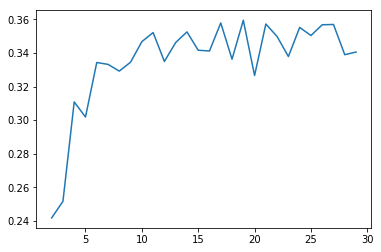

In [25]:
plt.plot(np.arange(2,max_clusters,1),silhouette)

### Hierarchical

In [26]:
max_clusters = 30
silhouette, _ = ce.u_clustering_eval(max_clusters,AgglomerativeClustering(),features_pca_unsup)
np.argmax(silhouette)+2,np.max(silhouette)

(15, 0.3517211079220648)

In [27]:
ce.get_k_local_optima(np.array(silhouette),3)

[15, 22, 28]

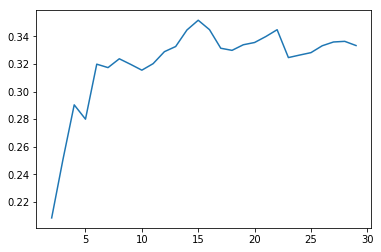

In [28]:
plt.plot(np.arange(2,max_clusters,1),silhouette)

### PAM

In [ ]:
#max_clusters = 25
#silhouette = []
#calinski_index = []
#for i in range(15,max_clusters):
 #   print(i)
  #  distance_matrix = pairwise_distances(features_pca_unsup,metric="manhattan")
   # medoids_idx, clusters =pam.pam(distance_matrix, i)
    #s = silhouette_score(features_pca_unsup, clusters, metric='euclidean')
    #c = calinski_harabaz_score(features, clusters) 
    #silhouette.append(s)
    #calinski_index.append(c)

In [ ]:
#np.argmax(silhouette)+15,np.max(silhouette)

In [ ]:
#plt.plot(np.arange(15,max_clusters,1),silhouette)

In [27]:
nb_clusters = 17

In [28]:
clusters = KMeans(n_clusters=nb_clusters, random_state = best_random_state).fit_predict(features_pca_unsup)

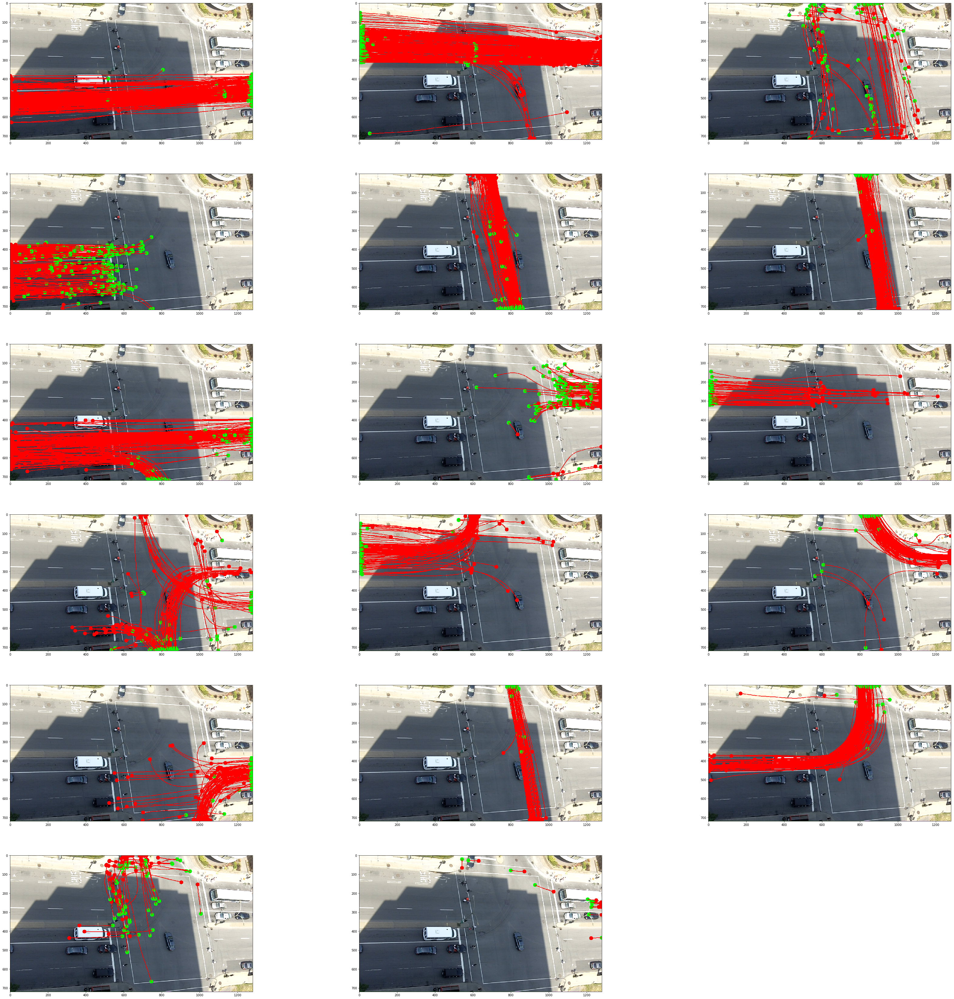

In [29]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories_unsup)

In [30]:
nb_clusters = 15

In [32]:
clusters = AgglomerativeClustering(n_clusters=nb_clusters).fit_predict(features_pca_unsup)

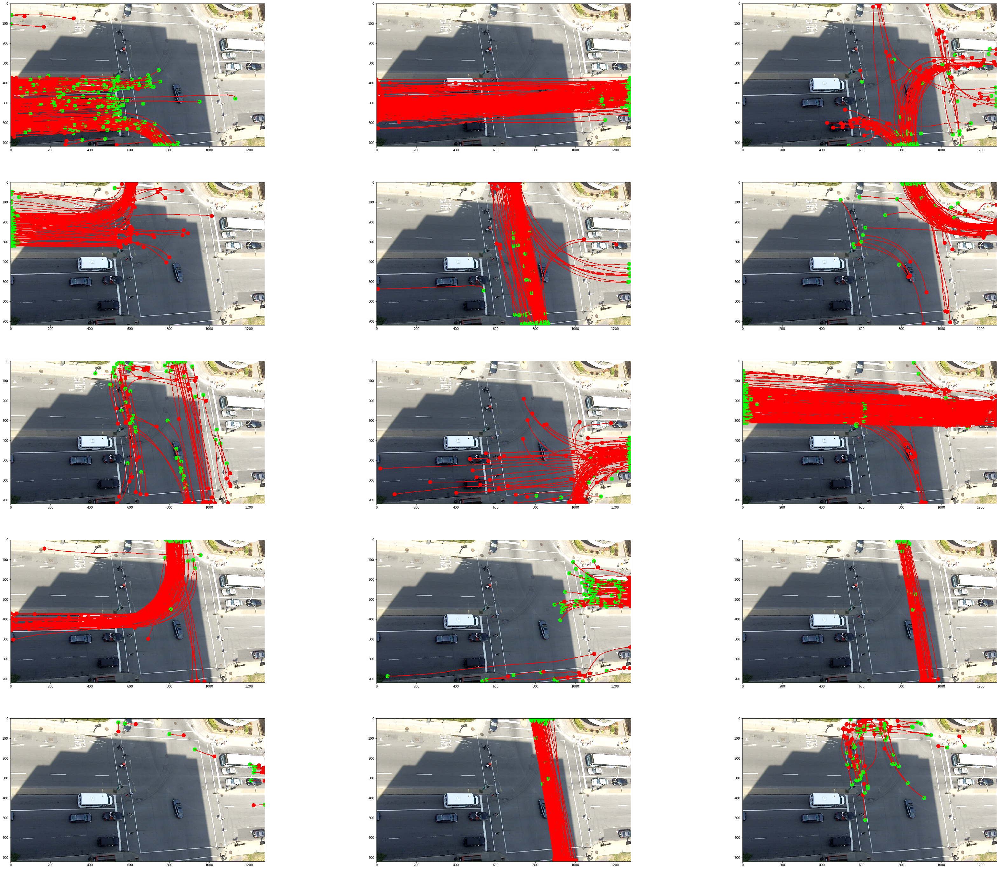

In [33]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories_unsup)

### Stats about clusters

mean x

<BarContainer object of 23 artists>

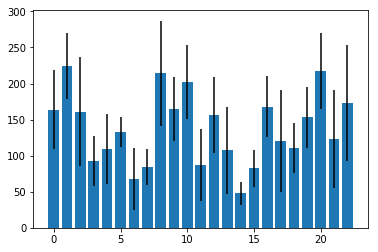

In [95]:
stats = ce.get_clusters_stats(trajectories_unsup,nb_clusters,clusters)
plt.bar(np.arange(0,nb_clusters),stats[:,0,0],yerr = stats[:,1,0])

mean y

<BarContainer object of 23 artists>

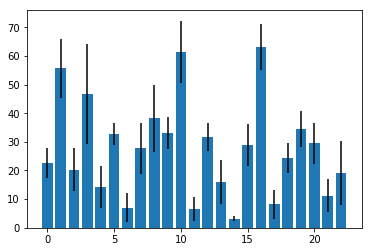

In [97]:
#stats = ce.get_clusters_stats(trajectories_unsup,nb_clusters,clusters)
plt.bar(np.arange(0,nb_clusters),stats[:,0,1],yerr = stats[:,1,1])

mean velocity of a cluster

<BarContainer object of 23 artists>

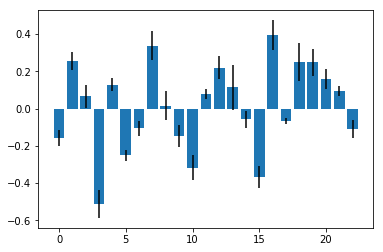

In [98]:
#stats = ce.get_clusters_stats(trajectories_unsup,nb_clusters,clusters)
plt.bar(np.arange(0,nb_clusters),stats[:,0,2],yerr = stats[:,1,2])

mean rate of turn of a cluster

<BarContainer object of 23 artists>

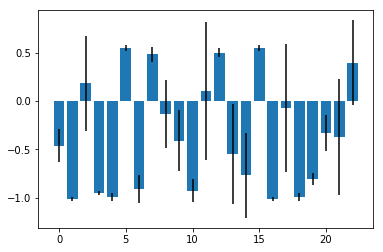

In [99]:
plt.bar(np.arange(0,nb_clusters),stats[:,0,3],yerr = stats[:,1,3])

# Observations/Conclusions